<a href="https://colab.research.google.com/github/leptonline/course20/blob/master/ImgCls_Summits_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#hide
!pip install -Uqq fastbook
import fastbook
import os
fastbook.setup_book()

     |████████████████████████████████| 727kB 4.2MB/s 
     |████████████████████████████████| 194kB 46.8MB/s 
     |████████████████████████████████| 1.2MB 45.4MB/s 
     |████████████████████████████████| 51kB 6.5MB/s 
     |████████████████████████████████| 61kB 7.9MB/s 
Mounted at /content/gdrive


In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


{'webSearchUrl': 'https://www.bing.com/images/search?view=detailv2&FORM=OIIRPO&q=summits&id=58AE60E8558FAC74D873D37BE5CD16E77D39F04A&simid=608028307331025680', 'name': 'The high summits around Zermatt, Switzerland image - Free ...', 'thumbnailUrl': 'https://tse3.mm.bing.net/th?id=OIP.JBKgFarAapt_u7qv9uiSaQHaE7&pid=Api', 'datePublished': '2020-06-06T11:59:00.0000000Z', 'isFamilyFriendly': True, 'creativeCommons': 'PublicNoRightsReserved', 'contentUrl': 'https://www.goodfreephotos.com/albums/switzerland/other-switzerland/high-summits-around-ermatt-switzerland.jpg', 'hostPageUrl': 'https://www.goodfreephotos.com/public-domain-images/high-summits-around-ermatt-switzerland.jpg.php', 'contentSize': '250283 B', 'encodingFormat': 'jpeg', 'hostPageDisplayUrl': 'https://www.goodfreephotos.com/public-domain-images/high-summits-around-ermatt...', 'width': 1024, 'height': 681, 'hostPageFavIconUrl': 'https://www.bing.com/th?id=ODF.j2vvE0U4IvbfMSjCwWDQ7g&pid=Api', 'hostPageDiscoveredDate': '2018-04-2

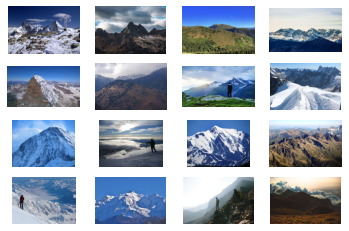

In [5]:
## Section 1 — Setup
## How to do bing image search then display thumbnails

import requests
import matplotlib.pyplot as plt
from io import BytesIO

subscription_key = "b75f15030d06445cbec3c735e53df123" #Replace XXX with your own API key
search_url = "https://api.bing.microsoft.com/v7.0/images/search"
search_term = "summits"

headers = {"Ocp-Apim-Subscription-Key" : subscription_key}

# Add in count parameter so that max number of images (150) is  #retrieved upon each API call. 
# Otherwise, default is 35.
params  = {"q": search_term, "license": "public", "imageType": "photo", "count":"150"}

response = requests.get(search_url, headers=headers, params=params)
response.raise_for_status()

# Return json file
search_results = response.json()
print(search_results["value"][0])
# Create a set of thumbnails for visualization
thumbnail_urls = [img["thumbnailUrl"] for img in search_results["value"][:16]]

f, axes = plt.subplots(4, 4)
for i in range(4):
    for j in range(4):
        image_data = requests.get(thumbnail_urls[i+4*j])
        image_data.raise_for_status()
        image = Image.open(BytesIO(image_data.content))        
        axes[i][j].imshow(image)
        axes[i][j].axis("off")
plt.show()

In [ ]:
# collate the list of image URLs from the search results JSON file. 
# The key that is associated with the image URL is contentUrl.
img_urls = [img['contentUrl'] for img in search_results["value"]]
len(img_urls)

120

In [ ]:
## Section 2 — Downloading Image Data

# Define categories in a list, 
# and create a Path to store the images we are going to download
summit_names = ["Mt Everest","Mt Fuji","Mt Kilimanjaro","Mt Matterhorn"]
path = Path('Summit5')

if not path.exists():
    path.mkdir()
    for summit_name in summit_names:
        dest = (path/summit_name)
        dest.mkdir(exist_ok=True)

        search_term = summit_name
        params = {"q":search_term, "license":"public", "imageType":"photo", "count":"150"}
        response = requests.get(search_url, headers=headers, params=params)
        response.raise_for_status()
        search_results = response.json()
        img_urls = [img['contentUrl'] for img in search_results["value"]]

        # Downloading images from the list of image URLs
        download_images(dest, urls=img_urls)

In [ ]:
# We should now have the images downloaded within the respective folders with 
# the label of the alcohol type. To confirm this,...
img_files = get_image_files(path)
img_files


(#481) [Path('Summit5/Mt Fuji/00000147.jpg'),Path('Summit5/Mt Fuji/00000125.jpg'),Path('Summit5/Mt Fuji/00000049.jpg'),Path('Summit5/Mt Fuji/00000068.jpg'),Path('Summit5/Mt Fuji/00000043.jpg'),Path('Summit5/Mt Fuji/00000085.jpg'),Path('Summit5/Mt Fuji/00000110.jpg'),Path('Summit5/Mt Fuji/00000075.jpg'),Path('Summit5/Mt Fuji/00000046.jpg'),Path('Summit5/Mt Fuji/00000103.jpg')...]

In [ ]:
# check whether the files we downloaded are corrupt or not
failed = verify_images(img_files)
failed

(#69) [Path('Summit5/Mt Fuji/00000125.jpg'),Path('Summit5/Mt Fuji/00000079.jpg'),Path('Summit5/Mt Fuji/00000062.jpg'),Path('Summit5/Mt Fuji/00000083.jpg'),Path('Summit5/Mt Fuji/00000071.jpg'),Path('Summit5/Mt Fuji/00000108.jpg'),Path('Summit5/Mt Fuji/00000015.jpg'),Path('Summit5/Mt Fuji/00000035.jpg'),Path('Summit5/Mt Fuji/00000140.jpg'),Path('Summit5/Mt Fuji/00000047.jpg')...]

In [ ]:
# remove these corrupt files (if any) from our dataset
failed.map(Path.unlink)

(#69) [None,None,None,None,None,None,None,None,None,None...]

In [ ]:
# Remove folder
# !rm -rf <'Summit3'>

/bin/bash: -c: line 0: syntax error near unexpected token `newline'
/bin/bash: -c: line 0: `rm -rf <'Summit3'>'


**Section 3 — Preparing Image Datasets**

fastai has a flexible system called the data block API. With this API, we can fully customize the creation of the DataLoaders object. DataLoaders can store whatever DataLoader objects we place in it, and it is used to generate training and validation sets subsequently.
In my interpretation, DataLoaders is essentially an object that stores information about the data we will run our model on. The DataBlock is basically a template function for creating DataLoaders.

In [ ]:
summits = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=1),
    get_y=parent_label,
    item_tfms=Resize(128))

dls = summits.dataloaders(path)

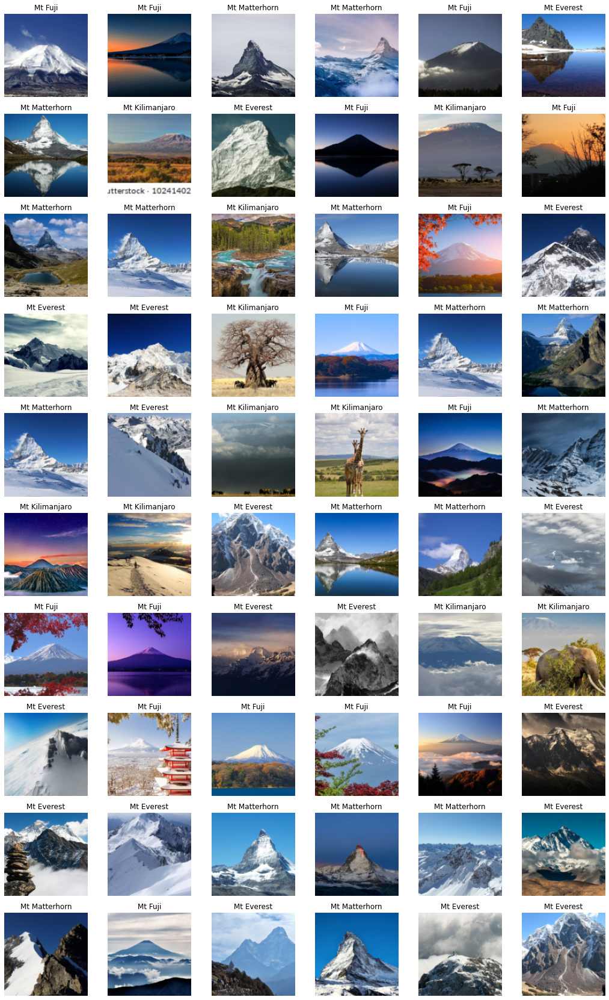

In [ ]:
# Let’s have a brief look at the images by showing a subset batch of 10 images 
# inside our validation set
dls.valid.show_batch(max_n=60, nrows=10)


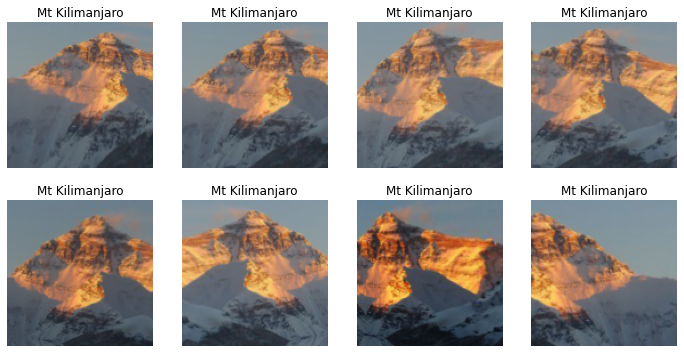

In [ ]:
# illustrates the effects of the augmentation transformation aug_transforms on a single input image
summits = summits.new(item_tfms=Resize(128), batch_tfms=aug_transforms())
dls = summits.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

**Section 4 — Training the Model**


In [ ]:
# prepare the DataLoaders object
# resize and crop our images at sizes of 224x224 pixel, with min_scale of 0.5
summits = summits.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = summits.dataloaders(path)

In [ ]:
# Convoluted neural network (CNN) is the de facto type of neural network used for image classification
# esnet34 (i.e. 34 layers deep) for the cnn_learner fast.ai function. Details of resnet can be found here.
# https://towardsdatascience.com/an-overview-of-resnet-and-its-variants-5281e2f56035

# We are using the .fine_tune method instead of .fit because we are leveraging on 
# the pretrained resnet model to perform transfer learning. We specify the 
# number of epochs to be 4 (i.e. argument inside .fine_tune)

learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(6)

epoch,train_loss,valid_loss,error_rate,time
0,2.391230,1.139380,0.414634,00:09


epoch,train_loss,valid_loss,error_rate,time
0,1.268490,0.877615,0.280488,00:09
1,1.073098,0.806348,0.292683,00:09
2,0.878686,0.579706,0.231707,00:09
3,0.764300,0.468273,0.170732,00:09
4,0.645667,0.415184,0.158537,00:09
5,0.585411,0.402436,0.170732,00:09


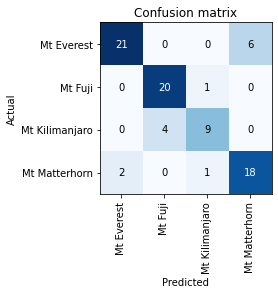

In [ ]:
#  Confusion Matrix
interpretation = ClassificationInterpretation.from_learner(learn)
interpretation.plot_confusion_matrix()

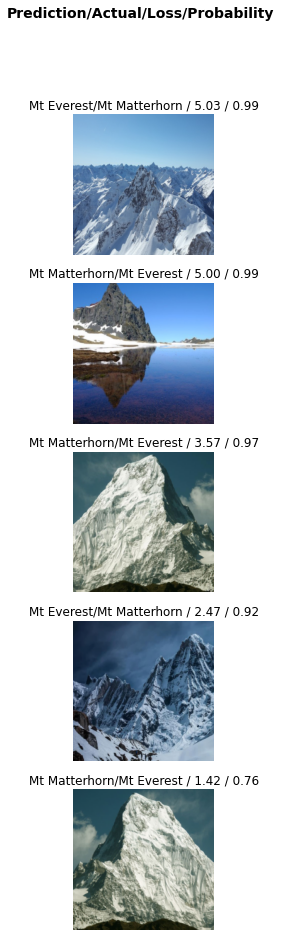

In [ ]:
# fast.ai also provides a easy method that allows us to find out which are the images where there was the highest loss.
interpretation.plot_top_losses(5, nrows=5)

**Section 5 — Cleaning the Data**

In [ ]:
# The data cleaning process is made easy with the in-built fast.ai 
# ImageClassifierCleaner Graphical User Interface (GUI) widget.
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
# Once you are done updating the options for the row of images 
# on display, run the following ‘cleaning’ code to execute the changes.
# Delete images marked as delete
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
    
# Update category of image to the newly specified category by moving # it into the appropriate folder
for idx,cat in cleaner.change(): shutil.copyfile(cleaner.fns[idx], path/cat)

# cleaner.delete removes the images you have tagged as <Delete>, while 
# cleaner.change shifts the image into the folder with the updated label.


**Retraining the model after data cleaning**

In [ ]:
dls = summits.dataloaders(path)
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,2.151766,1.696526,0.506494,00:08


epoch,train_loss,valid_loss,error_rate,time
0,1.360676,0.946278,0.298701,00:08
1,1.184214,0.633048,0.259740,00:08
2,0.960971,0.452596,0.194805,00:08
3,0.818677,0.395408,0.168831,00:08
4,0.701855,0.340353,0.116883,00:08


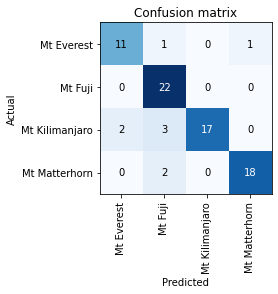

In [ ]:
interpretation = ClassificationInterpretation.from_learner(learn)
interpretation.plot_confusion_matrix()

In [ ]:
# to export the model so that the architecture, trained parameters and 
# DataLoaders setup is saved. All these will be saved into a pickle (.pkl) file.
learn.export()
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

**Section 6 — Using Image Classifier for Inference**

In [ ]:
# The model is now loaded into the learner variable learn_inf.
learn_inf = load_learner(path/'export.pkl')


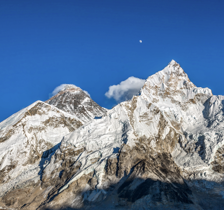

In [ ]:
# Sample image to test the model
ims = ['https://himalayajourney.com/wp-content/uploads/Nuptse-Everest.jpg']
dest = 'Images/test_everest.jpg'
download_url(ims[0], dest)
im = Image.open(dest)
im.to_thumb(224,224)

In [ ]:
learn_inf.predict('Images/test_everest.jpg')


('Mt Everest',
 tensor(0),
 tensor([9.9952e-01, 9.6840e-06, 9.1958e-06, 4.6078e-04]))

In [ ]:
learn_inf.dls.vocab

['Mt Everest', 'Mt Fuji', 'Mt Kilimanjaro', 'Mt Matterhorn']